In [1]:
%load_ext autoreload
%autoreload 2

In [7]:
import numpy as np
import pandas as pd
from PIL import Image,ImageOps
import cv2
import matplotlib.pyplot as plt
import os
from lwb_smr.predict import PredictRoof

In [20]:
%%time
# google_map_get = GetMapImage()
# google_image = google_map_get.get_map()
pred_roof_google = PredictRoof()
pred_roof_google.tile_split("LE_WAGON_LONDON.jpg",256,256)
roof_images_google = pred_roof_google.perform_prediction('Josh_model_vertexAI_09_FULL_dataset_ComboDiceBCE.h5')
pred_roof_google.output_mask(roof_images_google)

completed tiling prediction_input_image
1/1 [==============================] - 5s 5s/step
CPU times: user 1min 12s, sys: 7.91 s, total: 1min 19s
Wall time: 6.39 s


CPU times: user 3.01 s, sys: 0 ns, total: 3.01 s
Wall time: 2.94 s


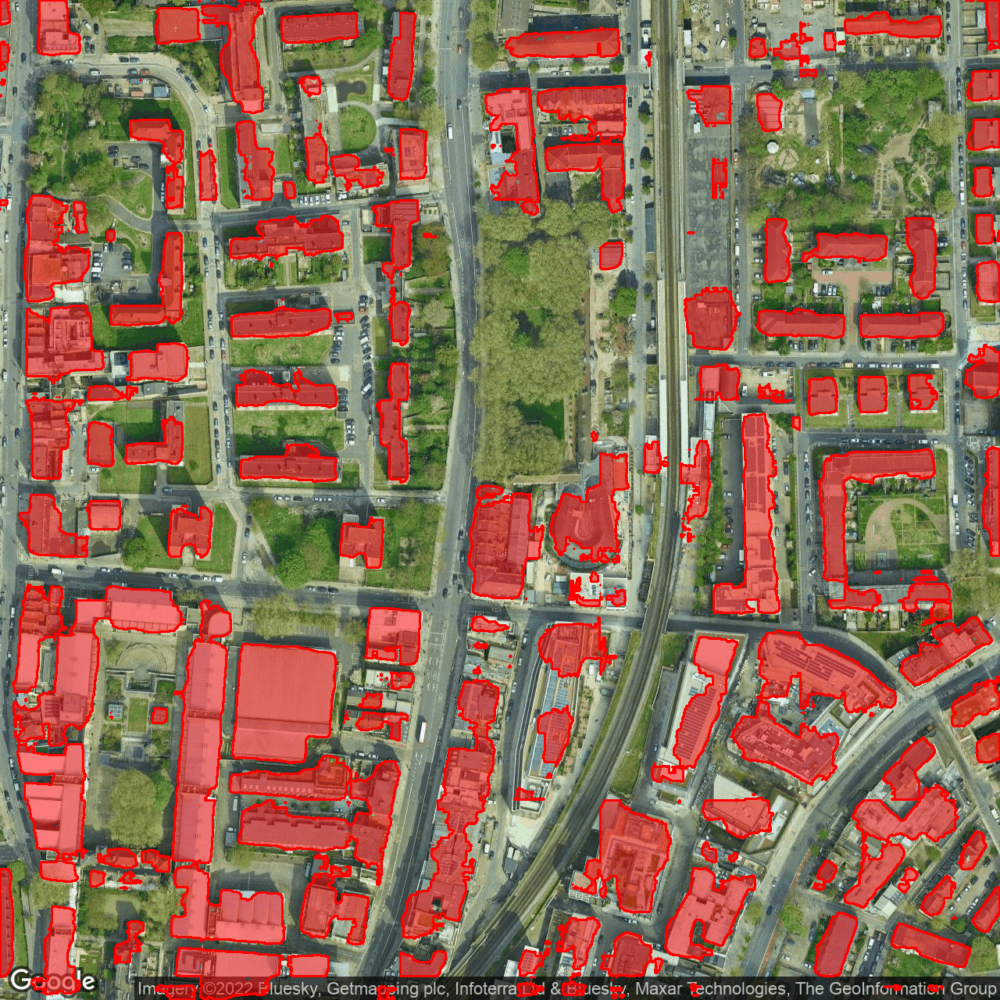

In [41]:
%%time
im = Image.open("../../raw_data/prediction/predicted_tiles_output/output_mask.jpg")
im = im.convert("RGBA")
pixels = im.load()

for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] < (128, 128, 128,255):
            # change to black if not red
            pixels[i,j] = (0, 0 ,0,255)
            
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] > (128, 128, 128,255):
            # change to black if not red
            pixels[i,j] = (255, 255 ,255,255)
            
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] == (255, 255, 255,255):
            # change to black if not red
            pixels[i,j] = (255, 0 ,0,255)

for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] == (0, 0, 0, 255):
            # change to black if not red
            pixels[i,j] = (0, 0 ,0, 0)
        if pixels[i,j] == (255, 0, 0, 255):
            # change to black if not red
            pixels[i,j] = (255, 0 ,0, 128)

background = Image.open("../../raw_data/prediction/google_map_images/E2_8DY.jpg")
background = background.convert("RGBA")

foreground = im
cimg = cv2.imread("../../raw_data/prediction/predicted_tiles_output/contour_mask.png")
mask = np.ones(cimg.shape, dtype=np.uint8) * 255
gray = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
cnts = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    cv2.drawContours(mask, [c], -1, (255, 0, 0), thickness=2)
contour_image = Image.fromarray(mask)
contour_image = contour_image.convert("RGBA")
contour_pixels = contour_image.load()
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if contour_pixels[i,j] == (255, 255, 255, 255):
            # change to black if not red
            contour_pixels[i,j] = (0, 0 ,0, 0)
base = Image.alpha_composite(background, foreground)
contoured_image_output = Image.alpha_composite(base,contour_image)
contoured_image_output

In [42]:
contoured_image_output.save("../../raw_data/prediction/predicted_tiles_output/contour_mask_01.png")

# Attempting contours

In [8]:
import cv2

CPU times: user 624 ms, sys: 985 µs, total: 625 ms
Wall time: 593 ms


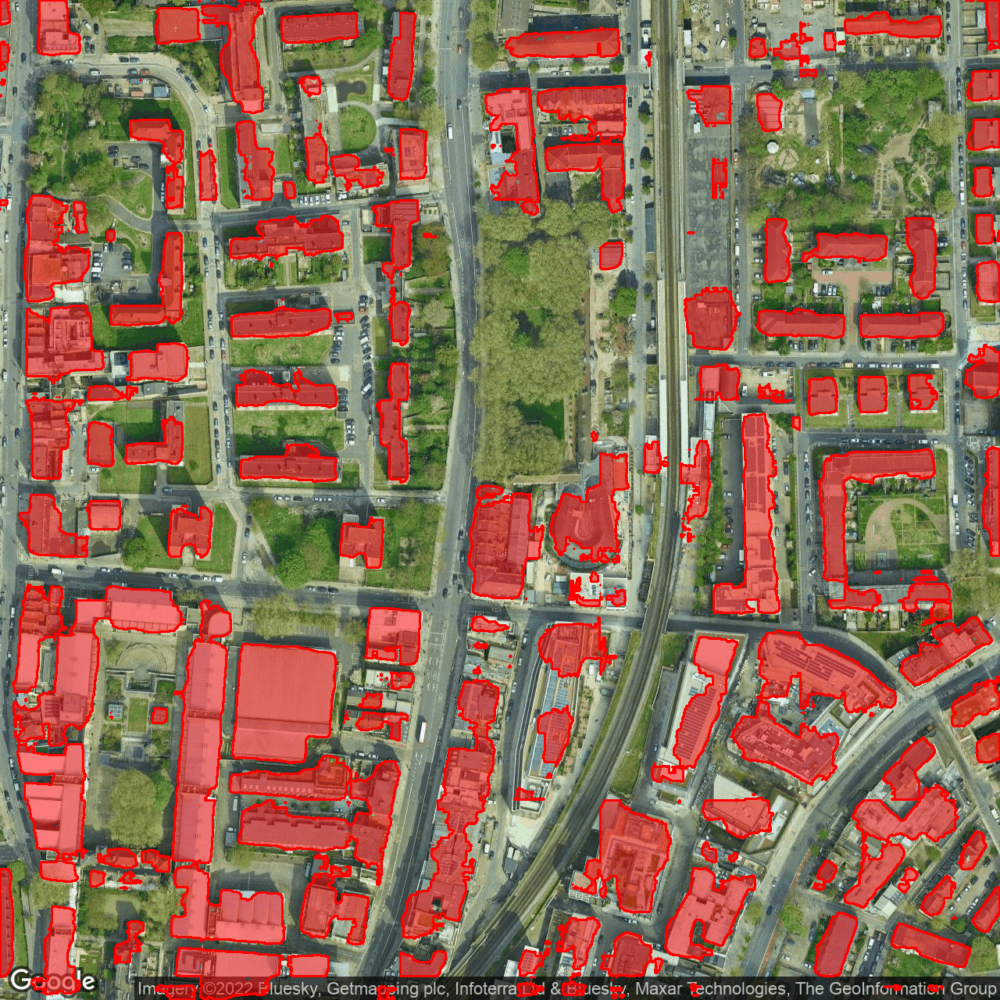

In [39]:
%%time
cimg = cv2.imread("../../raw_data/prediction/predicted_tiles_output/contour_mask.png")
mask = np.ones(cimg.shape, dtype=np.uint8) * 255
gray = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
cnts = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    cv2.drawContours(mask, [c], -1, (255, 0, 0), thickness=2)
contour_image = Image.fromarray(mask)
contour_image = contour_image.convert("RGBA")
contour_pixels = contour_image.load()
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if contour_pixels[i,j] == (255, 255, 255, 255):
            # change to black if not red
            contour_pixels[i,j] = (0, 0 ,0, 0)
base = Image.alpha_composite(background, foreground)
Image.alpha_composite(base,contour_image)

In [37]:
contour_pixels[0,100]

(255, 255, 255, 255)

# Variable colours

CPU times: user 3.22 s, sys: 8.73 ms, total: 3.23 s
Wall time: 3 s


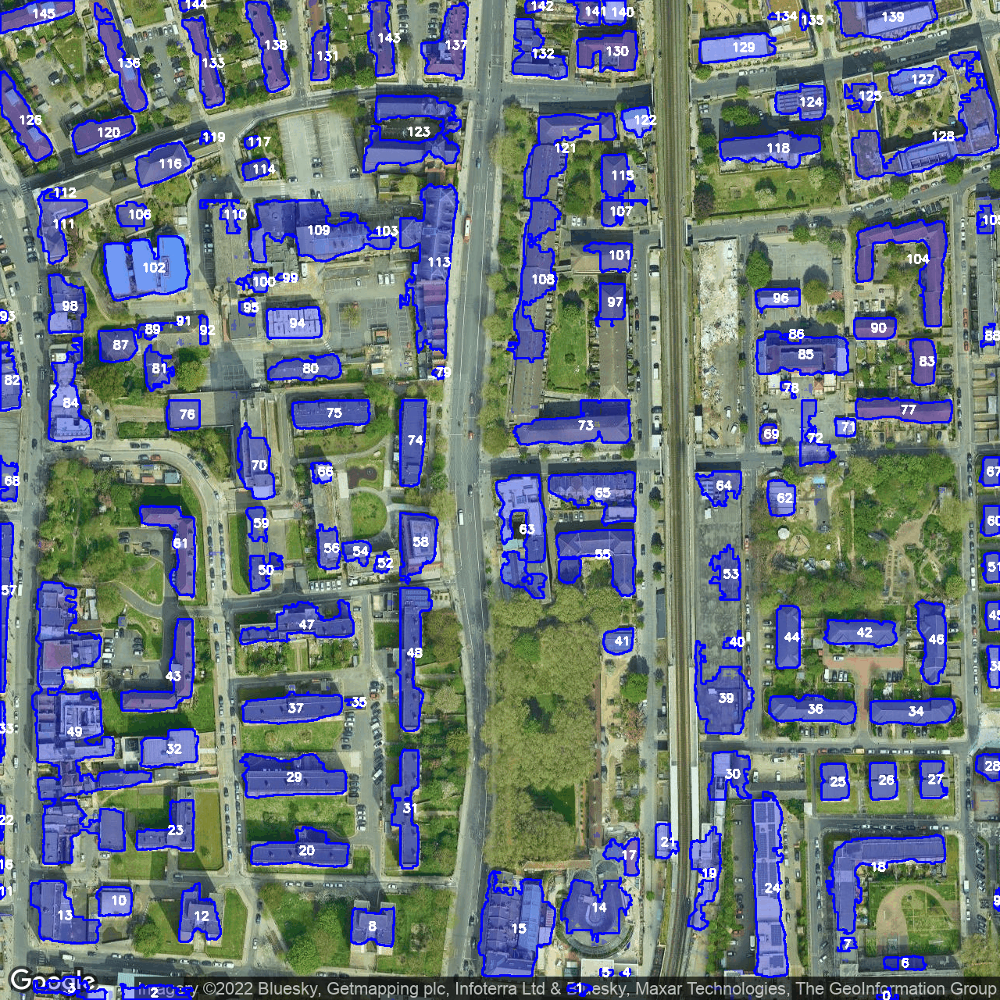

In [46]:
%%time
im = Image.open("../../raw_data/prediction/predicted_tiles_output/output_mask.jpg")
im = im.convert("RGBA")
pixels = im.load()
mask_r = 0
mask_g = 0
mask_b = 255
transparancy = 0.3 # listed as a percent and converted later
threshold_area = 60.0 # px
px_per_area = 0.25**2 # 25cm/pixel

for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] < (128, 128, 128, 255):
            # if below threshold, change to black
            pixels[i,j] = (0, 0 ,0, 0)
            
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] > (128, 128, 128,255):
            # if above threshold, change to white
            pixels[i,j] = (255, 255 ,255,255)
            
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] == (255, 255, 255,255):
            # change white pixels to red pixels
            pixels[i,j] = (mask_r, mask_g, mask_b, 255)
            # make the same red pixels 50% transparent
            pixels[i,j] = (mask_r, mask_g, mask_b, int(255*transparancy))

background = Image.open("../../raw_data/prediction/google_map_images/LE_WAGON_LONDON.jpg")
background = background.convert("RGBA")

foreground = im

cimg = cv2.cvtColor(np.array(foreground),cv2.COLOR_RGBA2RGB)

mask = np.ones(cimg.shape, dtype=np.uint8) * 255
gray = cv2.cvtColor(cimg, cv2.COLOR_BGR2GRAY)
cnts = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

cnts_thresh = []
for i in cnts:
    if cv2.contourArea(i) > threshold_area:
        cnts_thresh.append(i)

for c in cnts_thresh:
    cv2.drawContours(mask, [c], -1, (mask_r, mask_g, mask_b), thickness=2)
    
for count, c in enumerate(cnts_thresh):
    # Find centroid for each contour and label contour
    M = cv2.moments(c)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    cv2.putText(mask, str(count), (cx-5, cy+5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (254,254,254), 2)           
    
    
contour_image = Image.fromarray(mask)
contour_image = contour_image.convert("RGBA")
contour_pixels = contour_image.load()
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if contour_pixels[i,j] == (255, 255, 255, 255):
            # change to black if not specific colour
            contour_pixels[i,j] = (0, 0 ,0, 0)
            
base = Image.alpha_composite(background, foreground)
contoured_image_output = Image.alpha_composite(base,contour_image)
contoured_image_output.save("../../raw_data/prediction/predicted_tiles_output/contour_mask_03_numbered.png")
contoured_image_output

In [33]:
print(f"predicted number of roofs = {len(cnts_thresh)}")

predicted number of roofs = 146


In [34]:
get_roof = int(input("Enter roof number: "))
print(f"Roof number {get_roof} area = {cv2.contourArea(cnts_thresh[get_roof])*px_per_area}")

Enter roof number:  63


Roof number 63 area = 373.40625


In [98]:
area = cv2.contourArea(cnts[5])

In [106]:
cnts_sized = []
for i in range(len(cnts)):
    if cv2.contourArea(cnts[i]) > 5.0

TypeError: only integer scalar arrays can be converted to a scalar index

In [11]:
cnts_thresh = []
for i in cnts:
    if cv2.contourArea(i) > 40.0:
        cnts_thresh.append(i)

len(cnts_thresh)

12

In [12]:
for i in cnts_thresh:
    print(cv2.contourArea(i))

65.0
303.0
233.0
819.0
2227.5
9081.5
1003.5
566.5
1319.0
449.0
48.0
90.0


# Changing pixel colour

In [7]:
im = Image.open("../../raw_data/prediction/predicted_tiles_output/output_mask.jpg")

In [12]:
im = im.convert("RGB")
im.mode

'RGB'

In [20]:
im.getpixel((0,150))

(0, 0, 0)

In [21]:
pixels = im.load()

In [25]:
pixels[0,0]

(254, 254, 254)

In [26]:
im.size

(1280, 1280)

In [31]:
%%time
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] < (128, 128, 128):
            # change to black if not red
            pixels[i,j] = (0, 0 ,0)

CPU times: user 511 ms, sys: 0 ns, total: 511 ms
Wall time: 510 ms


In [30]:
%%time
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] > (128, 128, 128):
            # change to black if not red
            pixels[i,j] = (255, 255 ,255)

CPU times: user 381 ms, sys: 0 ns, total: 381 ms
Wall time: 380 ms


In [33]:
im.save("mask2.jpg")

In [34]:
%%time
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if pixels[i,j] == (255, 255, 255):
            # change to black if not red
            pixels[i,j] = (255, 0 ,0)

CPU times: user 373 ms, sys: 0 ns, total: 373 ms
Wall time: 372 ms


In [52]:
im.mode

'RGB'

In [37]:
background = Image.open("../../raw_data/prediction/google_map_images/E2_8DY.jpg")

In [70]:
# background.convert("RGBA")

In [40]:
im_alpha_red = im.convert("RGBA")
im_alpha_red.mode

'RGBA'

In [42]:
# im_alpha_red

In [43]:
alpha_pixel = im_alpha_red.load()

In [48]:
alpha_pixel[0,1]

(255, 0, 0, 255)

In [49]:
%%time
for i in range(im.size[0]): # for every pixel:
    for j in range(im.size[1]):
        if alpha_pixel[i,j] == (0, 0, 0, 255):
            # change to black if not red
            alpha_pixel[i,j] = (0, 0 ,0, 0)
        if alpha_pixel[i,j] == (255, 0, 0, 255):
            # change to black if not red
            alpha_pixel[i,j] = (255, 0 ,0, 128)

CPU times: user 1.48 s, sys: 0 ns, total: 1.48 s
Wall time: 1.48 s


In [51]:
alpha_pixel.mode

AttributeError: 'PixelAccess' object has no attribute 'mode'

In [53]:
im_alpha_red.mode

'RGBA'

In [54]:
im_alpha_red.save("../../raw_data/prediction/predicted_tiles_output/mask_rgba.png")

In [57]:
foreground = im_alpha_red

In [67]:
background = background.convert("RGBA")

In [68]:
background.mode

'RGBA'

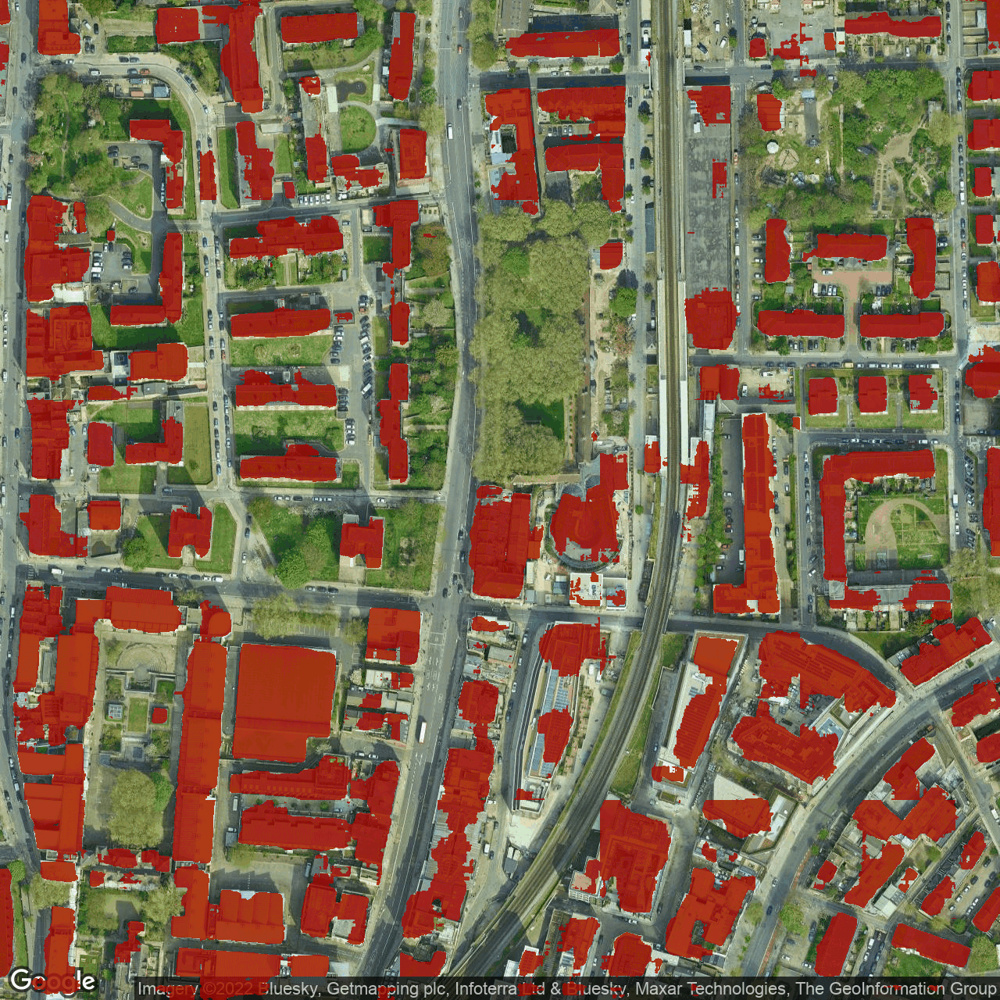

In [69]:
Image.alpha_composite(background, foreground)